### Support Vector Machines
#### Enrico Absin
TASK: Take 10 moderately sized subsamples your dataset and create a correlation plot for each subsample

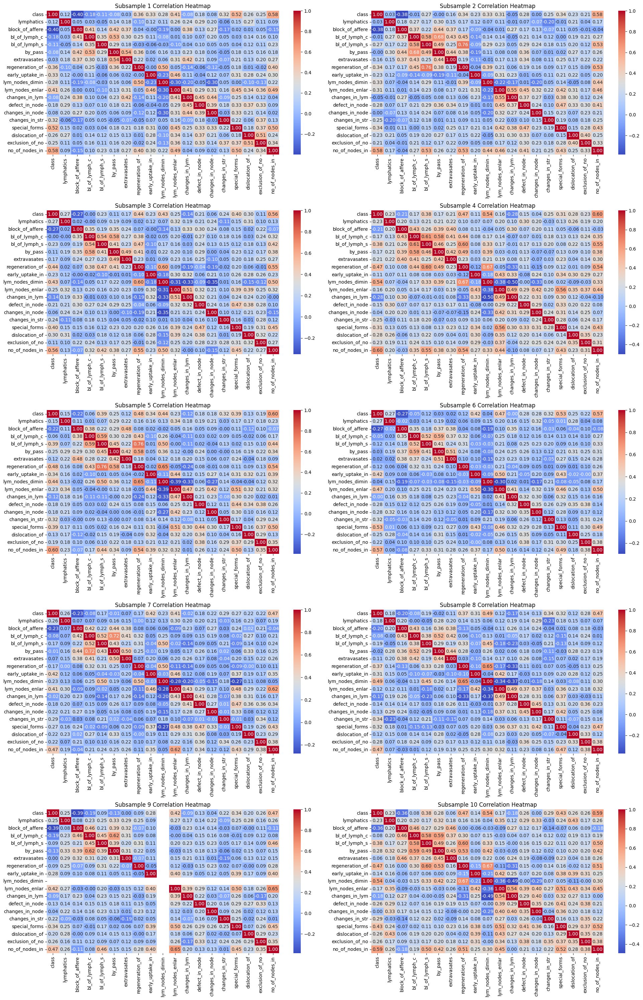

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

ds = 'lymphography.data'
column_names = ["class", "lymphatics", "block_of_affere", "bl_of_lymph_c", "bl_of_lymph_s",
                "by_pass", "extravasates", "regeneration_of", "early_uptake_in",
                "lym_nodes_dimin", "lym_nodes_enlar", "changes_in_lym", "defect_in_node",
                "changes_in_node", "changes_in_str", "special_forms", "dislocation_of",
                "exclusion_of_no", "no_of_nodes_in"]

df = pd.read_csv(ds, header=None, names=column_names)

def create_subsamples(data, n_samples=10, sample_size=0.5):
    subsamples = []
    for _ in range(n_samples):
        subsample = data.sample(frac=sample_size, random_state=np.random.randint(0, 10000))
        subsamples.append(subsample)
    return subsamples

subsamples = create_subsamples(df)

correlation_matrices = [subsample.corr() for subsample in subsamples]

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))
axes = axes.flatten()

for i, corr_matrix in enumerate(correlation_matrices):
    sns.heatmap(corr_matrix, ax=axes[i], annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    axes[i].set_title(f'Subsample {i+1} Correlation Heatmap')

plt.tight_layout()
plt.show()

TASK (Classification): If your problem is a classification problem visually check if the target variable is imbalanced TASK (Regression): If your problem is a regression problem visually the distribution of your target variabe

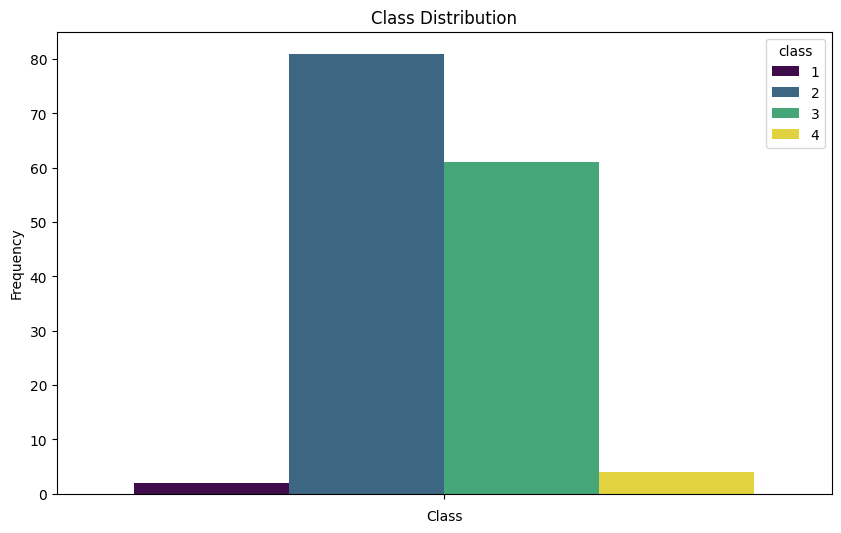

In [7]:
class_distribution = df['class'].value_counts().reset_index()
class_distribution.columns = ['class', 'count']

plt.figure(figsize=(10, 6))
sns.barplot(data=class_distribution, hue='class', y='count', palette='viridis')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

<Figure size 1200x1000 with 0 Axes>

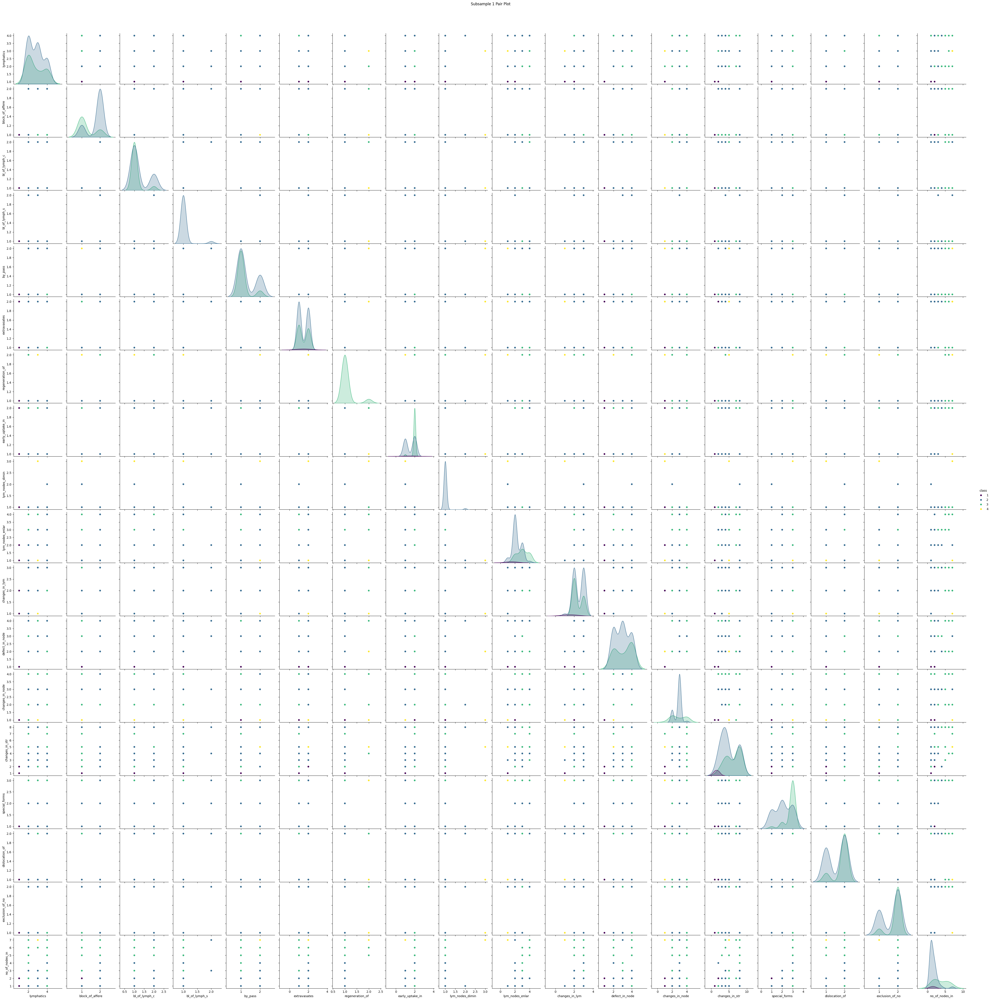

<Figure size 1200x1000 with 0 Axes>

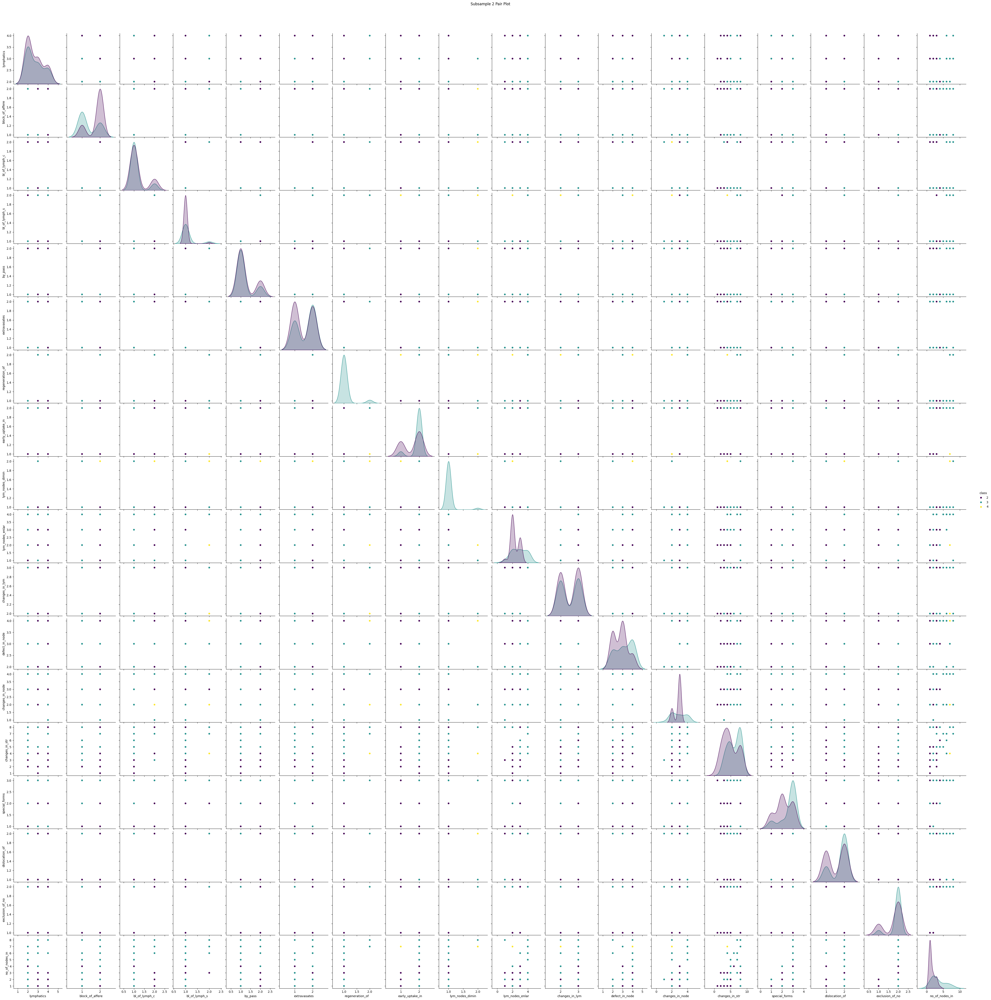

<Figure size 1200x1000 with 0 Axes>

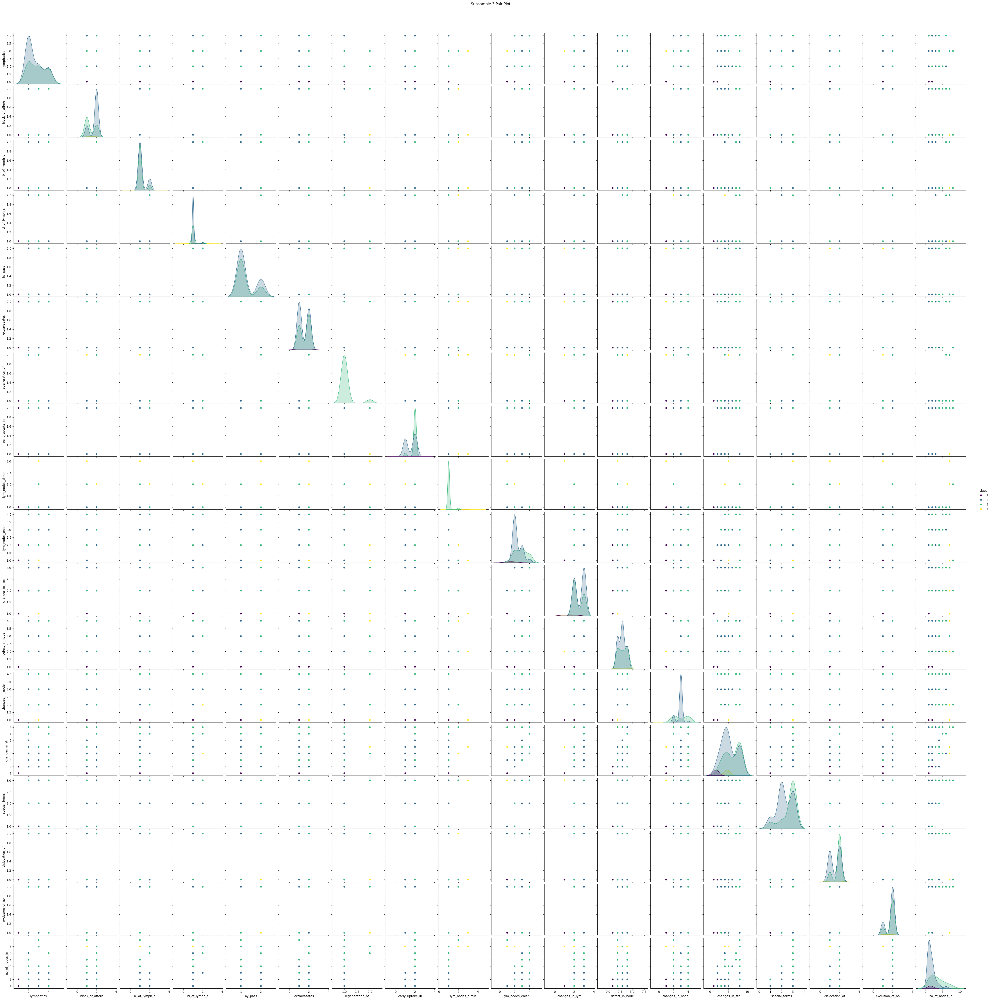

<Figure size 1200x1000 with 0 Axes>

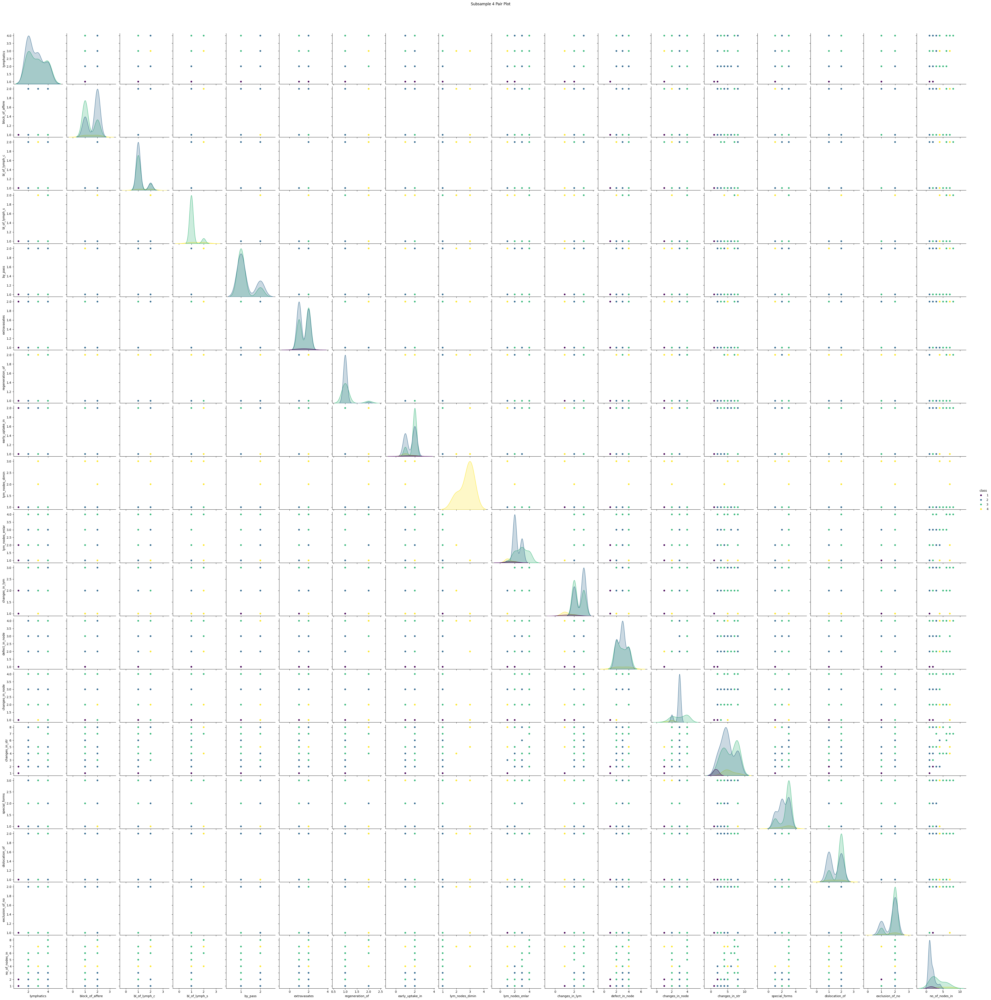

<Figure size 1200x1000 with 0 Axes>

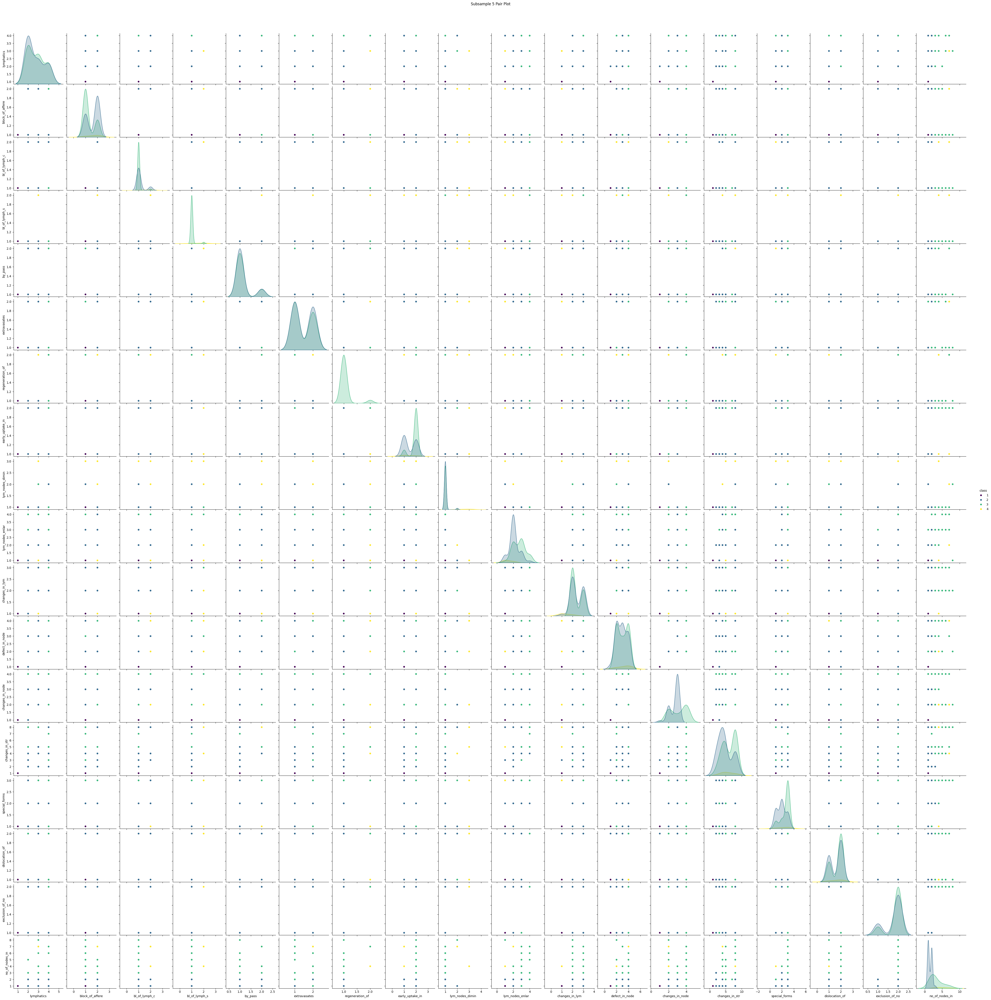

<Figure size 1200x1000 with 0 Axes>

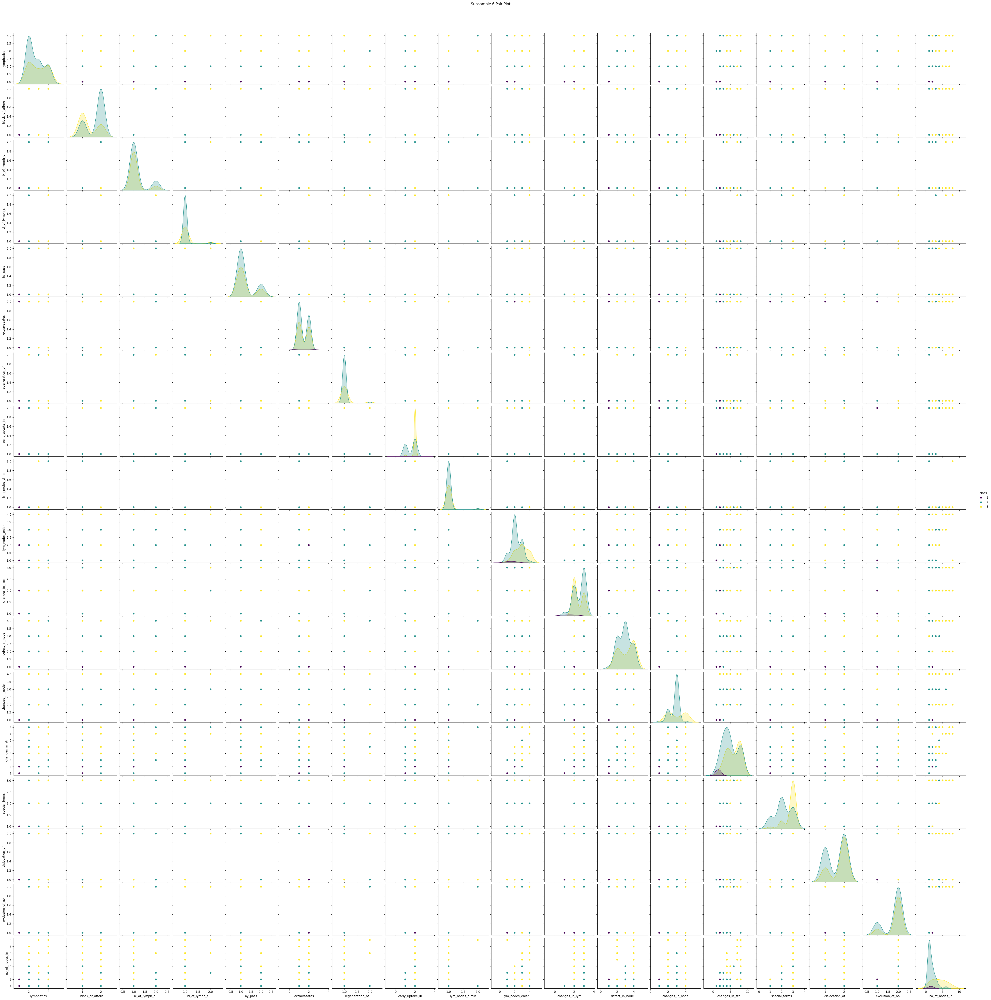

<Figure size 1200x1000 with 0 Axes>

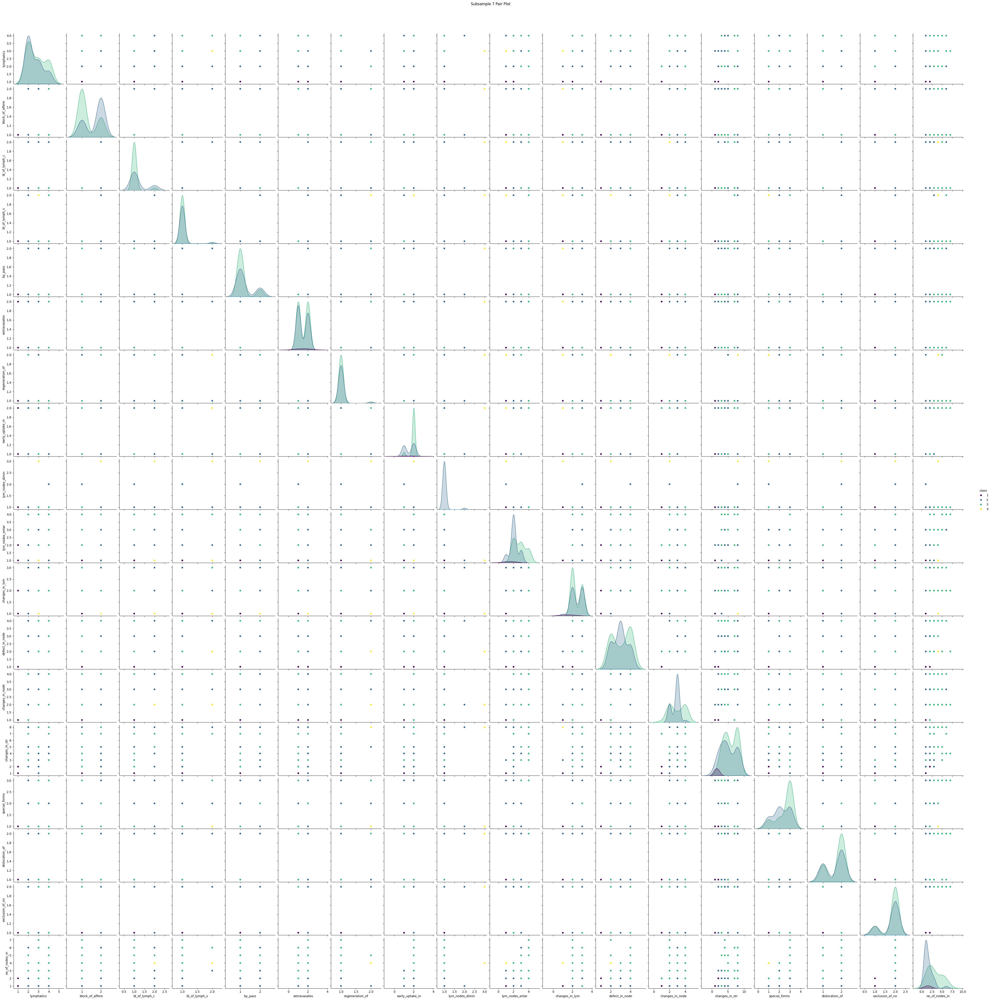

<Figure size 1200x1000 with 0 Axes>

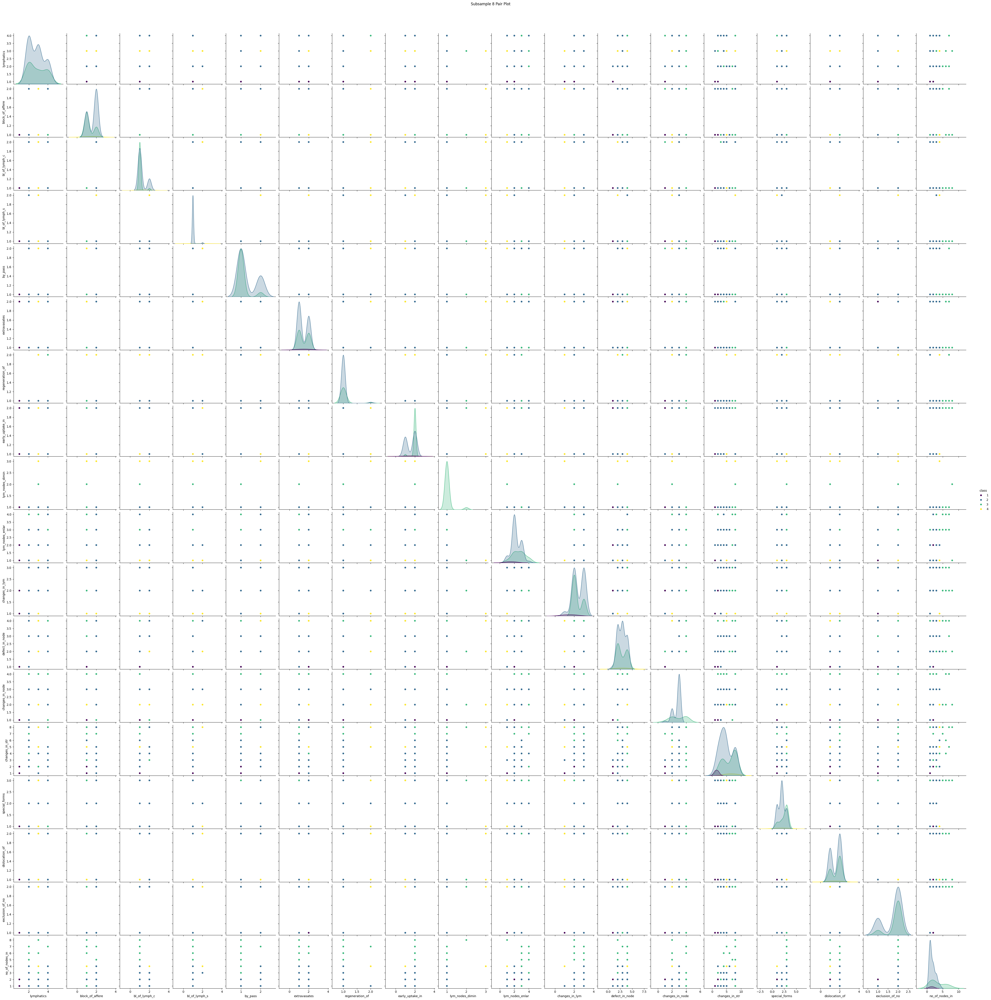

<Figure size 1200x1000 with 0 Axes>

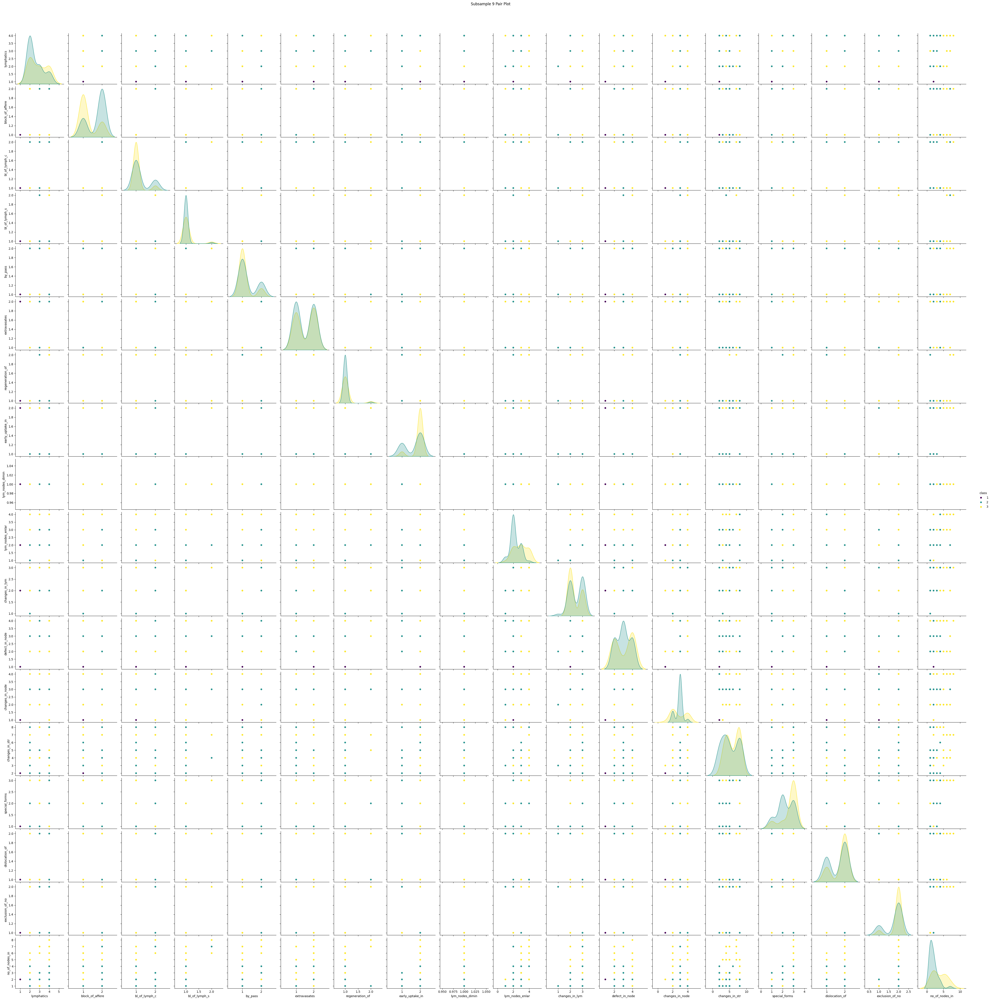

<Figure size 1200x1000 with 0 Axes>

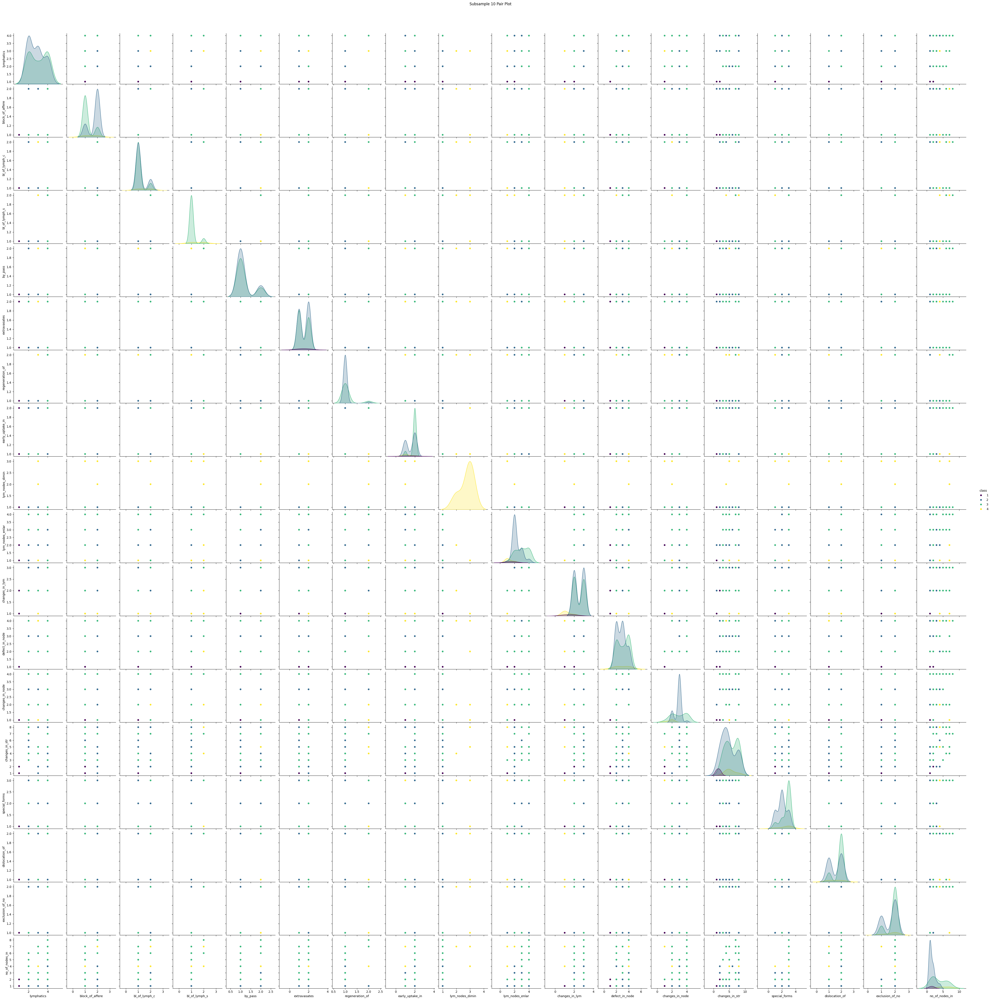

In [9]:
for i, subsample in enumerate(subsamples):
    plt.figure(figsize=(12, 10))
    pair_plot = sns.pairplot(subsample, hue='class', palette='viridis', diag_kind='kde')
    pair_plot.fig.suptitle(f'Subsample {i+1} Pair Plot', y=1.02)
    plt.show()

TASK: Create a clustermap with seaborn to explore the relationships between variables.

<Figure size 1200x1000 with 0 Axes>

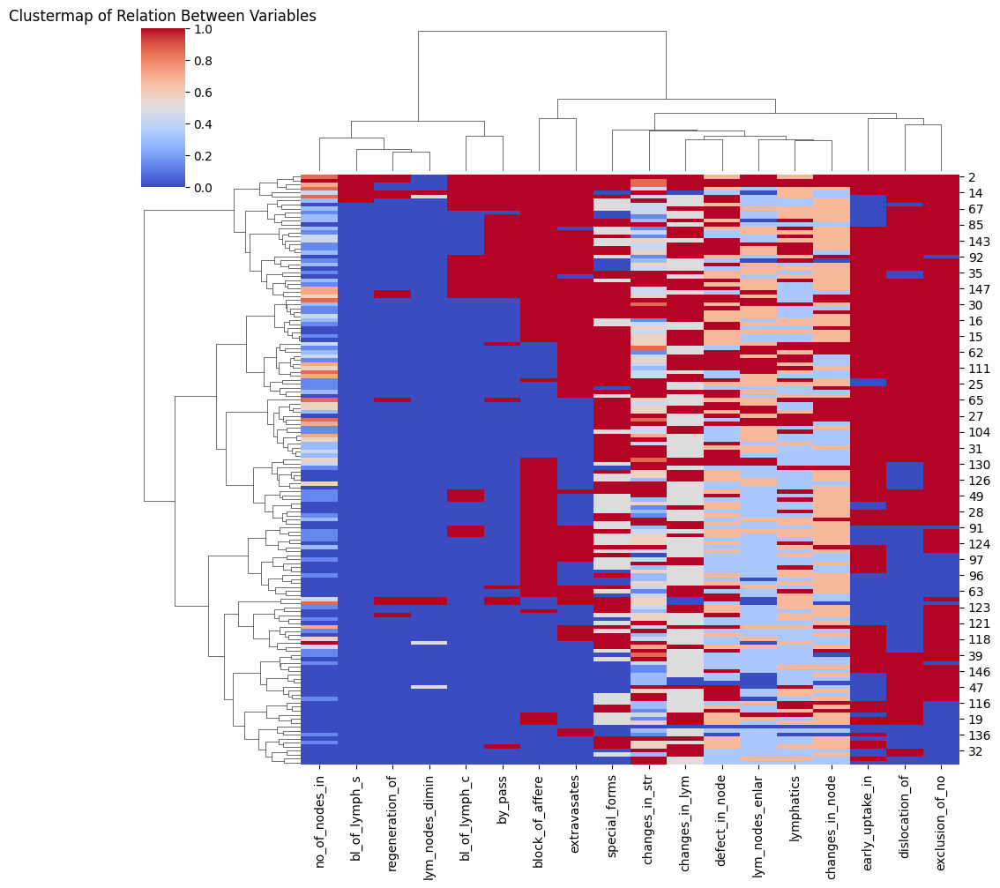

In [13]:
from sklearn.preprocessing import StandardScaler

features = df.drop(columns=['class'])

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

scaled_df = pd.DataFrame(scaled_features, columns=features.columns)

plt.figure(figsize=(12, 10))
sns.clustermap(scaled_df, cmap='coolwarm', metric='euclidean', method='ward', standard_scale=1)
plt.title('Clustermap of Relation Between Variables')
plt.show()

TASK: Perform SVM modelling and check the performance of your model, improve the performance of your model using grdisearch

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.utils.class_weight import compute_class_weight

X = df.drop(columns=['class'])
y = df['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}

svm_model = SVC(random_state=42, class_weight='balanced')
svm_model.fit(X_train_scaled, y_train)

y_pred = svm_model.predict(X_test_scaled)

print("Initial SVM Model Performance:")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred, zero_division=0))

Initial SVM Model Performance:
[[ 0  1  0  0]
 [ 0 20  5  0]
 [ 0  3 15  0]
 [ 0  0  1  0]]
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.83      0.80      0.82        25
           3       0.71      0.83      0.77        18
           4       0.00      0.00      0.00         1

    accuracy                           0.78        45
   macro avg       0.39      0.41      0.40        45
weighted avg       0.75      0.78      0.76        45



In [28]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'poly', 'sigmoid']
}

grid_search = GridSearchCV(SVC(random_state=42, class_weight='balanced'), param_grid, refit=True, verbose=2, cv=5)

grid_search.fit(X_train_scaled, y_train)
print("Best Parameters:", grid_search.best_params_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, k

c:\Users\Enrico\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ...................

In [29]:
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test_scaled)

print("Improved SVM Model Performance:")
print(confusion_matrix(y_test, y_pred_best))
print(classification_report(y_test, y_pred_best, zero_division=0))

Improved SVM Model Performance:
[[ 1  0  0  0]
 [ 0 22  3  0]
 [ 0  3 15  0]
 [ 0  0  0  1]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         1
           2       0.88      0.88      0.88        25
           3       0.83      0.83      0.83        18
           4       1.00      1.00      1.00         1

    accuracy                           0.87        45
   macro avg       0.93      0.93      0.93        45
weighted avg       0.87      0.87      0.87        45

